# Foreigners in Germany

This notebook analyzes a 100-meter grid covering all of Germany, investigating potential relationships between the foreign population and residential clusters.

In [1]:
ls /data/uscuni-germany/processed_data/

Bevoelkerung100M.parquet                 cluster_grid_assignment_v3.csv
Bevoelkerung100M_clusters.parquet        fbg_age.parquet
Familie100m.parquet                      fbg_ntn.parquet
Geb100m.parquet                          fbg_rgn.parquet
Haushalte100m.parquet                    foreigners_2022.parquet
Wohnungen100m.parquet                    regression_stats
Zensus_Bevoelkerung_100m-Gitter.parquet  rent_2022.parquet
cluster_grid_assignment_v2.csv


In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np


In [2]:
# Load cluster data
clusters = pd.read_csv('/data/uscuni-germany/processed_data/cluster_grid_assignment_v3.csv')
clusters

,Unnamed: 0,0
0,CRS3035RES100mN3046000E4121600,26
1,CRS3035RES100mN3046000E4122000,26
2,CRS3035RES100mN3046000E4122100,26
3,CRS3035RES100mN3046100E4122100,26
4,CRS3035RES100mN3046200E4121800,26
...,...,...
3064026,CRS3035RES100mN3105800E4663400,25
3064027,CRS3035RES100mN3105900E4663400,25
3064028,CRS3035RES100mN3105900E4663500,25
3064029,CRS3035RES100mN3106200E4663400,25


In [3]:
# Rename columns
clusters = clusters.rename(columns={"Unnamed: 0": "GITTER_ID_100m", "0": "cluster"})

In [4]:
clusters

,GITTER_ID_100m,cluster
0,CRS3035RES100mN3046000E4121600,26
1,CRS3035RES100mN3046000E4122000,26
2,CRS3035RES100mN3046000E4122100,26
3,CRS3035RES100mN3046100E4122100,26
4,CRS3035RES100mN3046200E4121800,26
...,...,...
3064026,CRS3035RES100mN3105800E4663400,25
3064027,CRS3035RES100mN3105900E4663400,25
3064028,CRS3035RES100mN3105900E4663500,25
3064029,CRS3035RES100mN3106200E4663400,25


In [5]:
# Read foreigners data
grid = gpd.read_parquet('/data/uscuni-germany/processed_data/foreigners_2022.parquet')
grid = grid.reset_index()

In [6]:
# Join cluster data with foreigners
cluster_grid = clusters.merge(grid, on = "GITTER_ID_100m", how = "right")
cluster_grid.head(2)

,GITTER_ID_100m,cluster,x_mp_100m,y_mp_100m,AnteilAuslaender,werterlaeuternde_Zeichen,geometry
0,CRS3035RES100mN2689100E4337000,18.0,4337050,2689150,"100,00",KLAMMERN,"POLYGON ((4337100 2689200, 4337100 2689100, 43..."
1,CRS3035RES100mN2689100E4341100,26.0,4341150,2689150,–,None,"POLYGON ((4341200 2689200, 4341200 2689100, 43..."


In [7]:
# Clean dataset
cluster_grid["AnteilAuslaender"] = cluster_grid["AnteilAuslaender"] \
    .str.replace(',', '.') \
    .replace('–', np.nan) \
    .astype('float')


In [8]:
# Create a new column with qunatiles
cluster_grid["f_share_cat"] = pd.qcut(cluster_grid["AnteilAuslaender"], q = 5,labels = [1, 2, 3, 4, 5])

In [9]:
cluster_grid

,GITTER_ID_100m,cluster,x_mp_100m,y_mp_100m,AnteilAuslaender,werterlaeuternde_Zeichen,geometry,f_share_cat
0,CRS3035RES100mN2689100E4337000,18.0,4337050,2689150,100.00,KLAMMERN,"POLYGON ((4337100 2689200, 4337100 2689100, 43...",5
1,CRS3035RES100mN2689100E4341100,26.0,4341150,2689150,NaN,None,"POLYGON ((4341200 2689200, 4341200 2689100, 43...",NaN
2,CRS3035RES100mN2690800E4341200,18.0,4341250,2690850,NaN,None,"POLYGON ((4341300 2690900, 4341300 2690800, 43...",NaN
3,CRS3035RES100mN2691200E4341200,18.0,4341250,2691250,27.27,KLAMMERN,"POLYGON ((4341300 2691300, 4341300 2691200, 43...",4
4,CRS3035RES100mN2691300E4341200,18.0,4341250,2691350,NaN,None,"POLYGON ((4341300 2691400, 4341300 2691300, 43...",NaN
...,...,...,...,...,...,...,...,...
3088038,CRS3035RES100mN3547500E4220100,1.0,4220150,3547550,NaN,None,"POLYGON ((4220200 3547600, 4220200 3547500, 42...",NaN
3088039,CRS3035RES100mN3547600E4219800,10.0,4219850,3547650,NaN,None,"POLYGON ((4219900 3547700, 4219900 3547600, 42...",NaN
3088040,CRS3035RES100mN3547600E4219900,10.0,4219950,3547650,36.36,KLAMMERN,"POLYGON ((4220000 3547700, 4220000 3547600, 42...",5
3088041,CRS3035RES100mN3547600E4220000,1.0,4220050,3547650,100.00,KLAMMERN,"POLYGON ((4220100 3547700, 4220100 3547600, 42...",5


In [11]:
# Group by clusters and calculate the distribution for foreigners
cluster_distribution = cluster_grid.groupby('cluster')['AnteilAuslaender'].describe().sort_values("std")
cluster_distribution

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
11.0,62608.0,19.203027,13.890240,1.66,9.760,15.220,24.2400,100.0
12.0,130449.0,19.490403,14.383074,1.30,9.760,15.380,25.0000,100.0
10.0,29485.0,19.975567,15.205721,1.04,10.000,15.710,25.0000,100.0
3.0,35949.0,23.930767,15.612713,1.02,12.330,20.690,31.8400,100.0
13.0,11217.0,19.024380,15.745574,1.75,9.380,14.290,22.9700,100.0
1.0,232977.0,21.104645,15.844357,0.82,9.720,16.670,27.9100,100.0
9.0,24413.0,20.600302,16.132361,0.73,9.760,15.790,26.1900,100.0
14.0,73028.0,22.437971,17.742402,1.45,10.870,16.950,27.5000,100.0
16.0,52134.0,23.386495,18.175244,1.03,11.110,17.910,29.4100,100.0


In [12]:
# Group by clusters and calculate the distribution of foreigners within quantiles
foreigners_distribution = cluster_grid.groupby('cluster')['f_share_cat'].value_counts().unstack()

foreigners_distribution['sum'] = foreigners_distribution.sum(axis=1)
foreigners_distribution = foreigners_distribution.div(foreigners_distribution['sum'], axis = 0)*100


In [13]:
foreigners_distribution

f_share_cat,1,2,3,4,5,sum
cluster,,,,,,
1.0,24.262910,19.748731,19.164123,20.033737,16.790499,100.0
3.0,16.448302,16.284180,20.117389,25.474978,21.675151,100.0
6.0,0.000000,0.000000,20.000000,0.000000,80.000000,100.0
8.0,NaN,NaN,NaN,NaN,NaN,NaN
9.0,23.962643,22.643673,19.936100,18.264859,15.192725,100.0
10.0,23.137188,23.812108,21.522808,18.297439,13.230456,100.0
11.0,23.786098,24.616662,21.551559,18.173396,11.872285,100.0
12.0,23.902061,24.284586,20.989812,18.271508,12.552032,100.0
13.0,26.433093,25.541589,21.173219,15.351698,11.500401,100.0


<Axes: xlabel='cluster'>

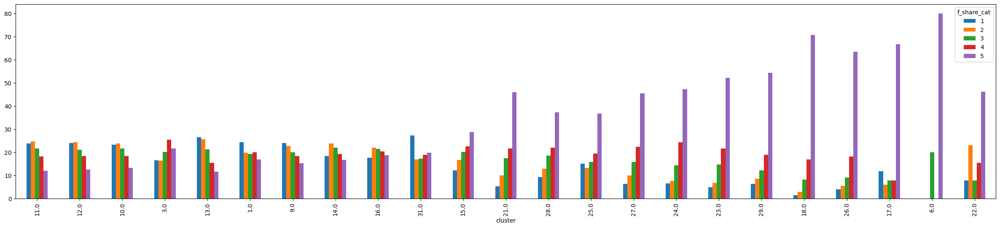

In [14]:
# Plot the quantiles against clusters
foreigners_distribution.iloc[:,:-1].loc[cluster_distribution.index].dropna().plot.bar(figsize=(30, 6))

In [10]:
mapping = pd.read_parquet('/data/uscuni-ulce/processed_data/clusters/cluster_mapping_v3.pq')

In [13]:
ids = mapping.reset_index().set_index(5, drop=False).loc[:, 4]

In [14]:
ids = ids[~ids.index.duplicated()]

In [15]:
cluster_grid['clsuter_16'] = cluster_grid.cluster.map(ids)

In [16]:
cluster_grid

,GITTER_ID_100m,cluster,x_mp_100m,y_mp_100m,AnteilAuslaender,werterlaeuternde_Zeichen,geometry,f_share_cat,clsuter_16
0,CRS3035RES100mN2689100E4337000,18.0,4337050,2689150,100.00,KLAMMERN,"POLYGON ((4337100 2689200, 4337100 2689100, 43...",5,9.0
1,CRS3035RES100mN2689100E4341100,26.0,4341150,2689150,NaN,None,"POLYGON ((4341200 2689200, 4341200 2689100, 43...",NaN,13.0
2,CRS3035RES100mN2690800E4341200,18.0,4341250,2690850,NaN,None,"POLYGON ((4341300 2690900, 4341300 2690800, 43...",NaN,9.0
3,CRS3035RES100mN2691200E4341200,18.0,4341250,2691250,27.27,KLAMMERN,"POLYGON ((4341300 2691300, 4341300 2691200, 43...",4,9.0
4,CRS3035RES100mN2691300E4341200,18.0,4341250,2691350,NaN,None,"POLYGON ((4341300 2691400, 4341300 2691300, 43...",NaN,9.0
...,...,...,...,...,...,...,...,...,...
3088038,CRS3035RES100mN3547500E4220100,1.0,4220150,3547550,NaN,None,"POLYGON ((4220200 3547600, 4220200 3547500, 42...",NaN,1.0
3088039,CRS3035RES100mN3547600E4219800,10.0,4219850,3547650,NaN,None,"POLYGON ((4219900 3547700, 4219900 3547600, 42...",NaN,5.0
3088040,CRS3035RES100mN3547600E4219900,10.0,4219950,3547650,36.36,KLAMMERN,"POLYGON ((4220000 3547700, 4220000 3547600, 42...",5,5.0
3088041,CRS3035RES100mN3547600E4220000,1.0,4220050,3547650,100.00,KLAMMERN,"POLYGON ((4220100 3547700, 4220100 3547600, 42...",5,1.0


In [20]:
cluster_grid.groupby('clsuter_16')['AnteilAuslaender'].describe().sort_values("mean")

,count,mean,std,min,25%,50%,75%,max
clsuter_16,,,,,,,,
6.0,193057.0,19.397207,14.225720,1.30,9.76,15.380,24.5900,100.0
5.0,53898.0,20.258540,15.635194,0.73,9.80,15.790,25.4850,100.0
1.0,232977.0,21.104645,15.844357,0.82,9.72,16.670,27.9100,100.0
7.0,84245.0,21.983461,17.528012,1.45,10.71,16.670,27.2700,100.0
16.0,14922.0,23.210450,20.996963,0.83,8.91,16.955,29.8175,100.0
2.0,35949.0,23.930767,15.612713,1.02,12.33,20.690,31.8400,100.0
8.0,140818.0,26.960079,20.977519,1.00,12.50,20.590,33.7800,100.0
11.0,244.0,37.498361,25.327817,3.31,18.75,31.980,50.0000,100.0
14.0,32917.0,38.757826,27.694989,1.15,17.71,30.000,50.0000,100.0


In [21]:
# Group by clusters and calculate the distribution of foreigners within quantiles
foreigners_distribution = cluster_grid.groupby('clsuter_16')['f_share_cat'].value_counts().unstack()

foreigners_distribution['sum'] = foreigners_distribution.sum(axis=1)
foreigners_distribution = foreigners_distribution.div(foreigners_distribution['sum'], axis = 0)*100


<Axes: xlabel='clsuter_16'>

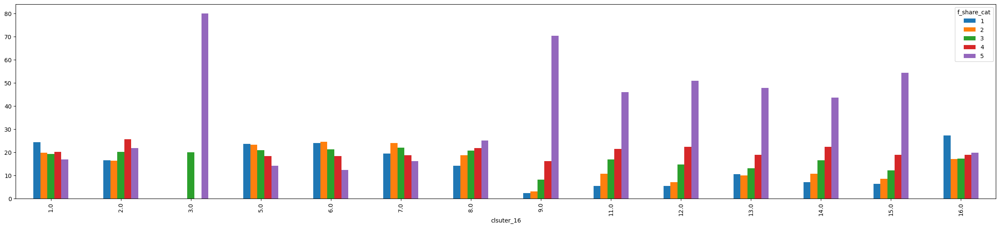

In [22]:
foreigners_distribution.iloc[:,:-1].dropna().plot.bar(figsize=(30, 6))

In [23]:
cluster_grid

,GITTER_ID_100m,cluster,x_mp_100m,y_mp_100m,AnteilAuslaender,werterlaeuternde_Zeichen,geometry,f_share_cat,clsuter_16
0,CRS3035RES100mN2689100E4337000,18.0,4337050,2689150,100.00,KLAMMERN,"POLYGON ((4337100 2689200, 4337100 2689100, 43...",5,9.0
1,CRS3035RES100mN2689100E4341100,26.0,4341150,2689150,NaN,None,"POLYGON ((4341200 2689200, 4341200 2689100, 43...",NaN,13.0
2,CRS3035RES100mN2690800E4341200,18.0,4341250,2690850,NaN,None,"POLYGON ((4341300 2690900, 4341300 2690800, 43...",NaN,9.0
3,CRS3035RES100mN2691200E4341200,18.0,4341250,2691250,27.27,KLAMMERN,"POLYGON ((4341300 2691300, 4341300 2691200, 43...",4,9.0
4,CRS3035RES100mN2691300E4341200,18.0,4341250,2691350,NaN,None,"POLYGON ((4341300 2691400, 4341300 2691300, 43...",NaN,9.0
...,...,...,...,...,...,...,...,...,...
3088038,CRS3035RES100mN3547500E4220100,1.0,4220150,3547550,NaN,None,"POLYGON ((4220200 3547600, 4220200 3547500, 42...",NaN,1.0
3088039,CRS3035RES100mN3547600E4219800,10.0,4219850,3547650,NaN,None,"POLYGON ((4219900 3547700, 4219900 3547600, 42...",NaN,5.0
3088040,CRS3035RES100mN3547600E4219900,10.0,4219950,3547650,36.36,KLAMMERN,"POLYGON ((4220000 3547700, 4220000 3547600, 42...",5,5.0
3088041,CRS3035RES100mN3547600E4220000,1.0,4220050,3547650,100.00,KLAMMERN,"POLYGON ((4220100 3547700, 4220100 3547600, 42...",5,1.0


In [17]:
import lonboard
from lonboard.colormap import apply_continuous_cmap
from sidecar import Sidecar
import matplotlib as mpl
from mapclassify import classify

In [22]:
cluster_grid = gpd.GeoDataFrame(cluster_grid).dropna(subset='AnteilAuslaender')

In [32]:
layer = lonboard.SolidPolygonLayer.from_geopandas(cluster_grid)

from sidecar import Sidecar
sc = Sidecar(title=f'Grid')
m = lonboard.Map(layer, basemap_style=lonboard.basemap.CartoBasemap.DarkMatter)
with sc:
    display(m)

/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/lonboard/_geoarrow/ops/reproject.py:97: UserWarning: Input being reprojected to EPSG:4326 CRS
  warnings.warn("Input being reprojected to EPSG:4326 CRS")


In [74]:
classifier = classify(cluster_grid.AnteilAuslaender, 'userdefined', bins=[5, 10, 15, 20, 25, 30, 35, 40, 100])
normalizer = mpl.colors.Normalize(0, classifier.bins.shape[0])
vals = normalizer(classifier.yb)
colors = apply_continuous_cmap(vals, mpl.colormaps['Greens'])
# mask = cluster_grid.cluster == 1
# colors[~mask] = [0, 0, 0]
layer.get_fill_color = colors

In [40]:
colors

array([[  0, 104,  41],
       [ 92, 184, 106],
       [ 92, 184, 106],
       ...,
       [  0, 104,  41],
       [ 26, 131,  62],
       [  0, 104,  41]], dtype=uint8)

In [325]:
dortmund = gpd.tools.geocode("mannheim, germany", provider="nominatim", user_agent="nsdfk").to_crs(cluster_grid.crs).buffer(5000)

In [326]:
xm, ym, xx, yx = dortmund.total_bounds
dortmund_grid = cluster_grid.cx[xm:xx, ym:yx]

In [327]:
dortmund_grid

,GITTER_ID_100m,cluster,x_mp_100m,y_mp_100m,AnteilAuslaender,werterlaeuternde_Zeichen,geometry,f_share_cat,clsuter_16,cluster_8
792275,CRS3035RES100mN2926800E4205800,1.0,4205850,2926850,33.80,None,"POLYGON ((4205900 2926900, 4205900 2926800, 42...",4,1.0,1.0
792276,CRS3035RES100mN2926800E4205900,1.0,4205950,2926850,19.51,KLAMMERN,"POLYGON ((4206000 2926900, 4206000 2926800, 42...",3,1.0,1.0
792277,CRS3035RES100mN2926800E4206000,1.0,4206050,2926850,24.53,None,"POLYGON ((4206100 2926900, 4206100 2926800, 42...",4,1.0,1.0
792278,CRS3035RES100mN2926800E4206100,12.0,4206150,2926850,5.88,KLAMMERN,"POLYGON ((4206200 2926900, 4206200 2926800, 42...",1,6.0,3.0
792279,CRS3035RES100mN2926800E4206200,1.0,4206250,2926850,13.04,KLAMMERN,"POLYGON ((4206300 2926900, 4206300 2926800, 42...",2,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
840111,CRS3035RES100mN2936800E4212100,12.0,4212150,2936850,5.08,KLAMMERN,"POLYGON ((4212200 2936900, 4212200 2936800, 42...",1,6.0,3.0
840112,CRS3035RES100mN2936800E4212200,1.0,4212250,2936850,8.11,KLAMMERN,"POLYGON ((4212300 2936900, 4212300 2936800, 42...",1,1.0,1.0
840113,CRS3035RES100mN2936800E4212300,10.0,4212350,2936850,27.27,KLAMMERN,"POLYGON ((4212400 2936900, 4212400 2936800, 42...",4,5.0,3.0
840114,CRS3035RES100mN2936800E4212600,12.0,4212650,2936850,24.32,KLAMMERN,"POLYGON ((4212700 2936900, 4212700 2936800, 42...",4,6.0,3.0


In [328]:
cluster_grid.AnteilAuslaender.median()

np.float64(17.86)

In [18]:
from libpysal.graph import Graph
from esda import Moran_Local

In [330]:
queen = Graph.build_contiguity(dortmund_grid, rook=False)

moran = Moran_Local(dortmund_grid.AnteilAuslaender, queen.higher_order(5))

/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


In [331]:
dortmund_grid['moran'] = moran.get_cluster_labels()

/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [332]:
moran.explore(dortmund_grid, crit_value=.1)

In [333]:
form = Graph.build_block_contiguity(dortmund_grid.clsuter_16)
foreign = Graph.build_block_contiguity(dortmund_grid.moran == "High-High")

In [334]:
%time contig_form = queen.intersection(form)

CPU times: user 291 ms, sys: 2.41 ms, total: 294 ms
Wall time: 293 ms


In [335]:
%time contig_foreign = queen.intersection(foreign)

CPU times: user 733 ms, sys: 83.9 ms, total: 817 ms
Wall time: 817 ms


In [336]:
contig_foreign

<Graph of 3085 nodes and 16904 nonzero edges indexed by
 [792275, 792276, 792277, 792278, 792279, ...]>

In [337]:
form_card = contig_form.cardinalities

In [338]:
segregation = contig_form.intersection(contig_foreign)

In [339]:
seg_card = segregation.cardinalities

In [340]:
diff = form_card - seg_card

In [341]:
dortmund_grid.explore(diff, tiles="cartodb positron")

In [342]:
all_seg = queen.cardinalities - contig_foreign.cardinalities
dortmund_grid.explore(all_seg, tiles="cartodb positron")

In [343]:
dortmund_grid.explore(all_seg - diff, tiles="cartodb positron")

In [346]:
(all_seg - diff).sum() / all_seg.sum()

np.float64(0.3523489932885906)

In [347]:
(all_seg - diff).astype(bool).sum() / all_seg.astype(bool).sum()

np.float64(0.5098039215686274)

In [344]:
dortmund_grid.explore('clsuter_16', categorical=True, tiles="cartodb positron")

In [19]:
nuts = gpd.read_file("/data/uscuni-germany/2022/NUTS_RG_60M_2024_3035.geojson")

In [23]:
nuts = nuts[(nuts.CNTR_CODE == 'DE') & (nuts.LEVL_CODE == 3)].to_crs(cluster_grid.crs)

In [24]:
from tqdm.auto import tqdm

In [29]:
def segregation(region):
    try:
        local_grid = cluster_grid[cluster_grid.intersects(region)].copy()
        queen = Graph.build_contiguity(local_grid, rook=False)
    
        moran = Moran_Local(local_grid.AnteilAuslaender, queen.higher_order(5))
        local_grid['moran'] = moran.get_cluster_labels()
        form = Graph.build_block_contiguity(local_grid.clsuter_16)
        foreign = Graph.build_block_contiguity(local_grid.moran == "High-High")
        contig_form = queen.intersection(form)
        contig_foreign = queen.intersection(foreign)
        form_card = contig_form.cardinalities
        segregation = contig_form.intersection(contig_foreign)
        seg_card = segregation.cardinalities
        diff = form_card - seg_card
        all_seg = queen.cardinalities - contig_foreign.cardinalities
        weighted = (all_seg - diff).sum() / all_seg.sum()
        boolean = (all_seg - diff).astype(bool).sum() / all_seg.astype(bool).sum()
        print(weighted, boolean)
    except Exception:
        return np.nan, np.nan
    return weighted, boolean

In [30]:
from joblib import Parallel, delayed

In [32]:
%%time
results = Parallel(n_jobs=-1)(delayed(segregation)(region) for region in nuts.geometry)

/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered

nan nan
0.38333333333333336 0.5
0.3793103448275862 0.5027932960893855


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


0.8181818181818182 0.8461538461538461
0.3804878048780488 0.4692982456140351


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


0.3241525423728814 0.4826666666666667
0.4077669902912621 0.5561643835616439


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered

0.5413533834586466 0.7094017094017094
0.358974358974359 0.4444444444444444
0.3815261044176707 0.5319148936170213
0.4 0.5
0.49074074074074076 0.6703296703296703
nan nan
0.36507936507936506 0.5573770491803278
0.43333333333333335 0.5806451612903226
0.6 0.71875


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/tmp/ipykernel_3489716/2399799544.py:17: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_3489716/2399799544.py:18: RuntimeWarning: invalid value encountered in scalar divide
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  

0.30158730158730157 0.4827586206896552
0.3765432098765432 0.48125
0.30275229357798167 0.42452830188679247
0.37037037037037035 0.45614035087719296
0.4864864864864865 0.5714285714285714
0.7058823529411765 0.75
0.25 0.4
0.0 0.0
0.27058823529411763 0.3836065573770492


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered

0.25 0.375
0.34201954397394135 0.49458483754512633
0.3492252681764005 0.49363507779349364
0.4006849315068493 0.5581395348837209
nan nan
0.43 0.574468085106383
0.03278688524590164 0.06779661016949153
0.5555555555555556 0.6190476190476191
0.2619047619047619 0.3902439024390244
0.5714285714285714 0.6666666666666666
0.28 0.3793103448275862


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered

nan nan
0.0 0.0
0.5104166666666666 0.6153846153846154
0.37041420118343193 0.573268921095008


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


0.4166666666666667 0.5324675324675324
nan nan
0.38190954773869346 0.5207100591715976
0.296875 0.3698630136986301
nan nan
0.21875 0.3
0.16666666666666666 0.3333333333333333
0.25 0.4
0.2916666666666667 0.4444444444444444
0.45255474452554745 0.6981132075471698
nan nan
0.34285714285714286 0.4375
0.40754039497307004 0.6082949308755761


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered

0.31384615384615383 0.46551724137931033
0.22413793103448276 0.31666666666666665
0.6666666666666666 0.75
0.35714285714285715 0.3611111111111111
0.4444444444444444 0.5454545454545454
0.5263157894736842 0.5789473684210527
0.5517241379310345 0.6538461538461539
0.43661971830985913 0.5939086294416244
nan nan
0.5 0.5806451612903226
0.36 0.5
0.0 0.0
0.40707964601769914 0.564935064935065


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered

0.3181818181818182 0.41509433962264153
0.4424778761061947 0.5706806282722513
0.3564356435643564 0.45893719806763283
0.3130434782608696 0.4126984126984127
0.35 0.5
0.41358024691358025 0.6923076923076923
0.29411764705882354 0.34210526315789475
0.3946360153256705 0.556910569105691
0.19292604501607716 0.3046875
0.3867924528301887 0.5210526315789473
0.1111111111111111 0.18181818181818182
nan nan
0.27155172413793105 0.4347258485639687


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered

0.5833333333333334 0.6666666666666666
0.5 0.6
0.5 0.6666666666666666
0.3684210526315789 0.453125
0.4 0.5648148148148148
0.3333333333333333 0.5
0.6521739130434783 0.7586206896551724
nan nan
nan nan
0.27705627705627706 0.4941860465116279
0.35 0.44
0.5 0.6
0.42105263157894735 0.45454545454545453


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered

0.3357664233576642 0.5006915629322268
nan nan
0.5 0.6086956521739131
nan nan
0.352891156462585 0.4938737040527804


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


0.2564102564102564 0.38461538461538464
nan nan
nan nan
nan nan
0.37693006357856496 0.5560640732265446
0.5040650406504065 0.6283185840707964
0.4713375796178344 0.5855263157894737
0.20512820512820512 0.2765957446808511
0.44 0.4838709677419355


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


0.34297520661157027 0.5196078431372549
0.455521472392638 0.6290613718411552


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


0.448210922787194 0.6490384615384616
0.38268156424581007 0.5202492211838006


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/tmp/ipykernel_3489716/2399799544.py:17: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_3489716/2399799544.py:18: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_3489716/2399799544.py:17: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_3489716/2399799544.py:18: RuntimeWarning: invalid value encountered in scalar divide
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = 

0.4166666666666667 0.6363636363636364
nan nan
nan nan
0.0 0.0
nan nan
0.21212121212121213 0.3706293706293706
0.5 0.5897435897435898
nan nan
0.36363636363636365 0.4
0.3281807372175981 0.47240618101545256


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered

0.0625 0.125
nan nan
0.288135593220339 0.42857142857142855


/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/tmp/ipykernel_3489716/2399799544.py:17: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_3489716/2399799544.py:18: RuntimeWarning: invalid value encountered in scalar divide
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim
/tmp/ipykernel_3489716/2399799544.py:17: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_3489716/2399799544.py:18: RuntimeWarning: invalid value encountered in scalar divide
/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = 

0.384180790960452 0.5763888888888888
0.4208860759493671 0.6072106261859582
nan nan
0.3125 0.41509433962264153
0.29856115107913667 0.463768115942029
0.24945295404814005 0.40359897172236503
nan nan
0.2727272727272727 0.32142857142857145
nan nan
0.3835820895522388 0.5568760611205433
0.41812865497076024 0.5789473684210527
0.4166666666666667 0.5893719806763285
0.14285714285714285 0.20588235294117646
0.0 0.0
0.25925925925925924 0.3448275862068966
0.3611111111111111 0.5277777777777778
0.09523809523809523 0.16
0.5333333333333333 0.6666666666666666
0.0 0.0
1.0 1.0
nan nan
nan nan
0.525 0.6266666666666667
0.36012861736334406 0.556910569105691
0.5038759689922481 0.6259541984732825
0.4233687405159332 0.6113013698630136
0.4689265536723164 0.6402439024390244
nan nan
0.30517711171662126 0.48201438848920863
0.6666666666666666 0.875
0.27233250620347393 0.416403785488959
0.3333333333333333 0.3939393939393939
0.3631123919308357 0.46440677966101696
0.3 0.38461538461538464
0.3783783783783784 0.575757575757

In [35]:
nuts["weighted"] = [r[0] for r in results]
nuts["boolean"] = [r[1] for r in results]

<Axes: >

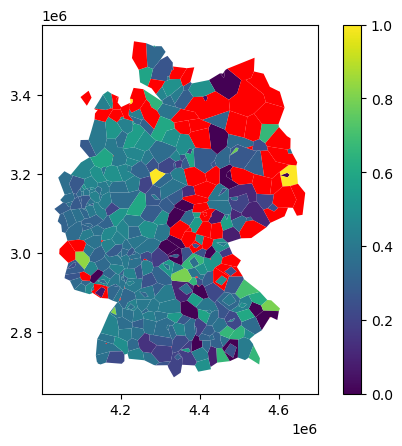

In [52]:
nuts.plot('weighted', legend=True, missing_kwds=dict(color='r'))

<Axes: >

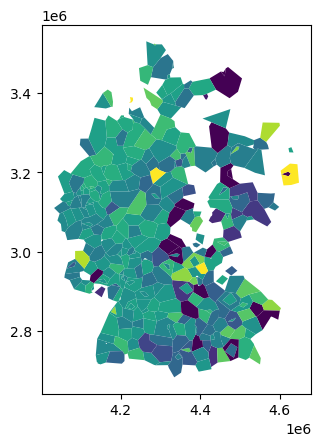

In [51]:
nuts.plot('boolean')

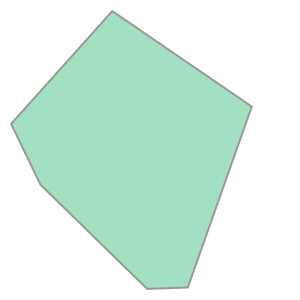

In [68]:
region = nuts[nuts.NUTS_ID == 'DEA52'].geometry.item()
region

In [69]:
local_grid = cluster_grid[cluster_grid.intersects(region)].copy()
queen = Graph.build_contiguity(local_grid, rook=False)

moran = Moran_Local(local_grid.AnteilAuslaender, queen.higher_order(5))
local_grid['moran'] = moran.get_cluster_labels()
form = Graph.build_block_contiguity(local_grid.clsuter_16)
foreign = Graph.build_block_contiguity(local_grid.moran)
contig_form = queen.intersection(form)
contig_foreign = queen.intersection(foreign)
form_card = contig_form.cardinalities
segregation = contig_form.intersection(contig_foreign)
seg_card = segregation.cardinalities
diff = form_card - seg_card
all_seg = queen.cardinalities - contig_foreign.cardinalities
weighted = (all_seg - diff).sum() / all_seg.sum()
boolean = (all_seg - diff).astype(bool).sum() / all_seg.astype(bool).sum()

/home/martin/dev/people_places_germany/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1084: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


In [70]:
weighted

np.float64(0.3616175008286377)

In [71]:
boolean

np.float64(0.541191381495564)

<Axes: >

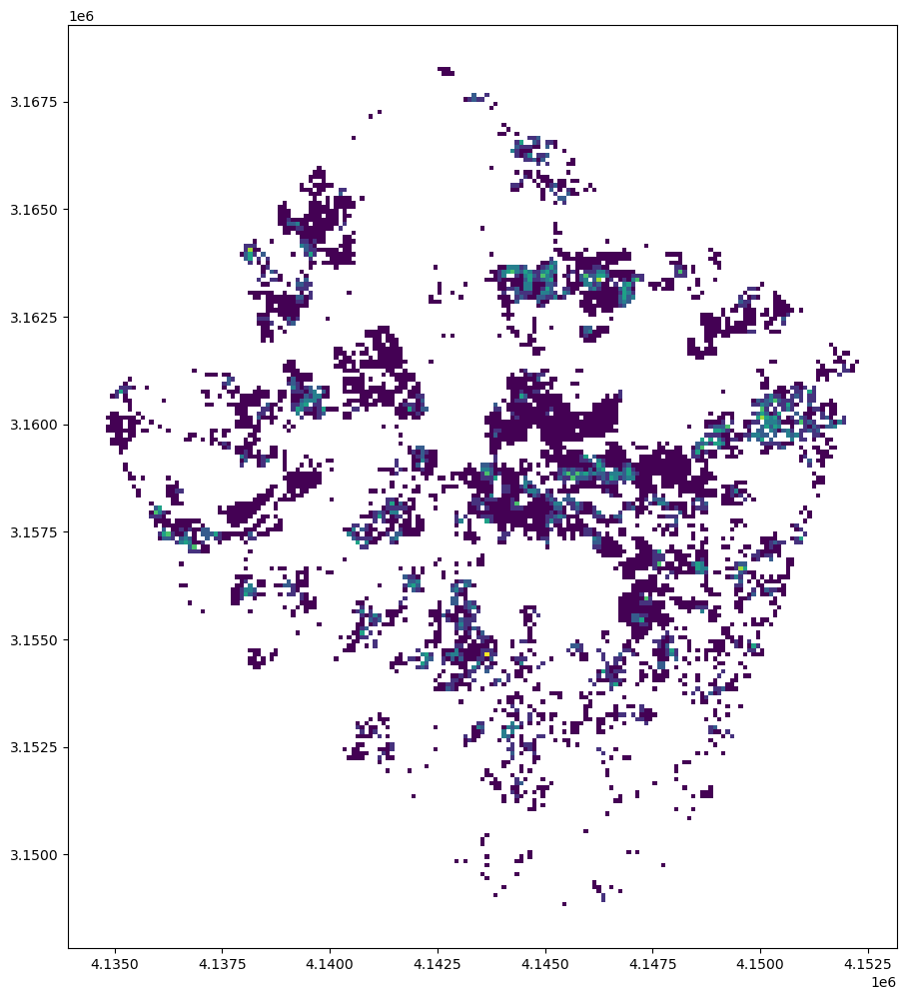

In [75]:
local_grid.plot(all_seg - diff, figsize=(12,12))

<Axes: >

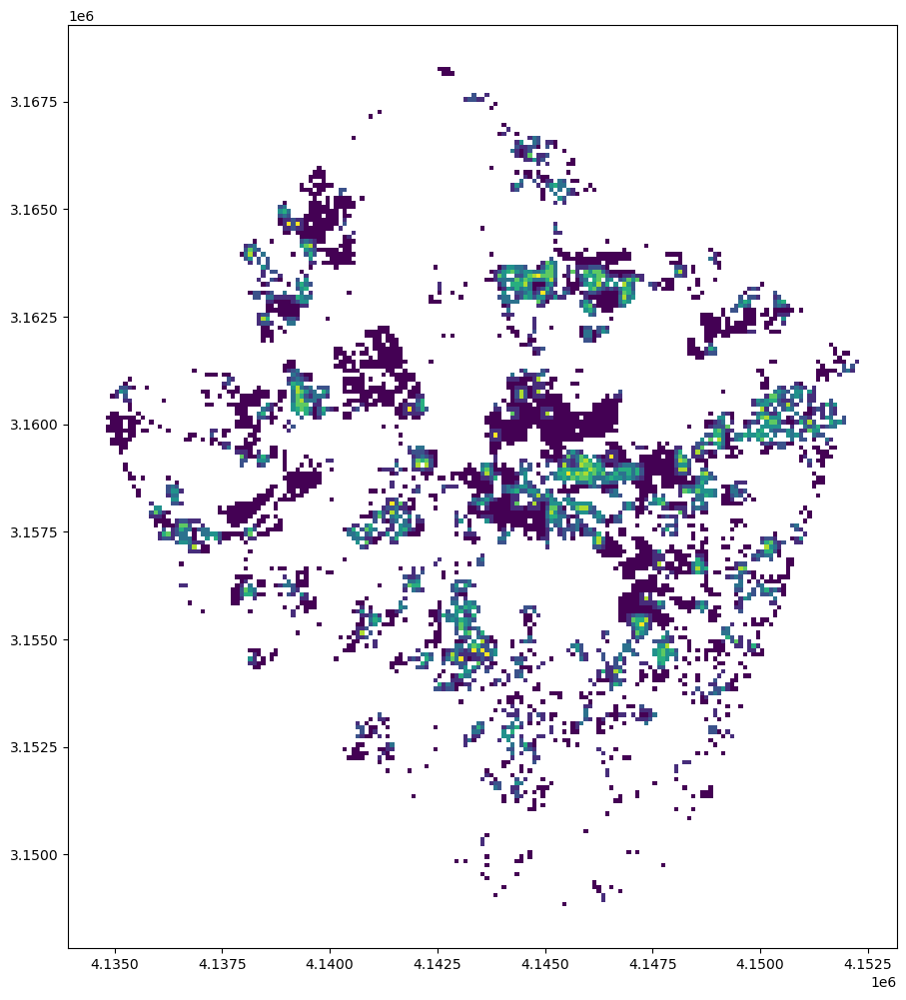

In [76]:
local_grid.plot(all_seg, figsize=(12,12))